<a href="https://colab.research.google.com/github/abdulilahalqasem/Supermarket-Sales/blob/main/Code/supermarket_sales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **#1 Import Libraries**

In [284]:
#pip install ydata-profiling
#pip install calmap

In [285]:
#Importing all the libraries needed.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calmap
from pandas_profiling import ProfileReport

#Models Importing.

from sklearn import svm
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder

from sklearn.model_selection import cross_validate



---

## **#2 Load Dataset**

In [286]:
#Load the dataset.
dataset_url = 'https://raw.githubusercontent.com/abdulilahalqasem/Supermarket-Sales/main/Dataset/supermarket_sales.csv'
df = pd.read_csv(dataset_url)


**Context**

The growth of supermarkets in most populated cities are increasing and market competitions are also high. The dataset is one of the historical sales of supermarket company which has recorded in 3 different branches for 3 months data. Predictive data analytics methods are easy to apply with this dataset.


**Attribute information**

**Invoice id:** Computer generated sales slip invoice identification number.

**Branch:** Branch of supercenter (3 branches are available identified by A, B and C).

**City:** Location of supercenters

**Customer type:** Type of customers, recorded by Members for customers using member card and Normal for without member card.

**Gender:** Gender type of customer

**Product line:** General item categorization groups - Electronic accessories, Fashion accessories, Food and beverages, Health and beauty, Home and lifestyle, Sports and travel

**Unit price:**Price of each product in $

**Quantity:** Number of products purchased by customer

**Tax:** 5% tax fee for customer buying

**Total:** Total price including tax

**Date:** Date of purchase (Record available from January 2019 to March 2019)

**Time:** Purchase time (10am to 9pm)

**Payment:** Payment used by customer for purchase (3 methods are available – Cash, Credit card and Ewallet)

**COGS:** Cost of goods sold

**Gross margin percentage:** Gross margin percentage

**Gross income:** Gross income

**Rating:** Customer stratification rating on their overall shopping experience (On a scale of 1 to 10)

---

## **#3 Exploratory Data Analysis (EDA)**

In [287]:
#Viewing the first 5 raws.
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [288]:
#Viewing all the coulmns.
df.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating'],
      dtype='object')

In [289]:
#Checking all the coulmns dtypes.
df.dtypes

Invoice ID                  object
Branch                      object
City                        object
Customer type               object
Gender                      object
Product line                object
Unit price                 float64
Quantity                     int64
Tax 5%                     float64
Total                      float64
Date                        object
Time                        object
Payment                     object
cogs                       float64
gross margin percentage    float64
gross income               float64
Rating                     float64
dtype: object

In [290]:
#Changing the 'Date' column dtype from object to datetime dtype.
df['Date'] = pd.to_datetime(df['Date'])
df['Date']

0     2019-01-05
1     2019-03-08
2     2019-03-03
3     2019-01-27
4     2019-02-08
         ...    
995   2019-01-29
996   2019-03-02
997   2019-02-09
998   2019-02-22
999   2019-02-18
Name: Date, Length: 1000, dtype: datetime64[ns]

In [291]:
#Making the 'Date' coulmn as index for the dataset.
df.set_index('Date',inplace=True)
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,
2019-01-05,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,13:08,Ewallet,522.83,4.761905,26.1415,9.1
2019-03-08,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,10:29,Cash,76.40,4.761905,3.8200,9.6
2019-03-03,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,13:23,Credit card,324.31,4.761905,16.2155,7.4
2019-01-27,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,20:33,Ewallet,465.76,4.761905,23.2880,8.4
2019-02-08,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [292]:
#Changing all the coulmn obejects types to the correct types.
df['Branch'] = df['Branch'].astype("string")
df['City'] = df['City'].astype("string")
df['Customer type'] = df['Customer type'].astype("string")
df['Gender'] = df['Gender'].astype("string")
df['Product line'] = df['Product line'].astype("string")
df['Payment'] = df['Payment'].astype("string")

In [293]:
#Viewing the max and min and mean of the dataset by using .describe() function.
df.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000


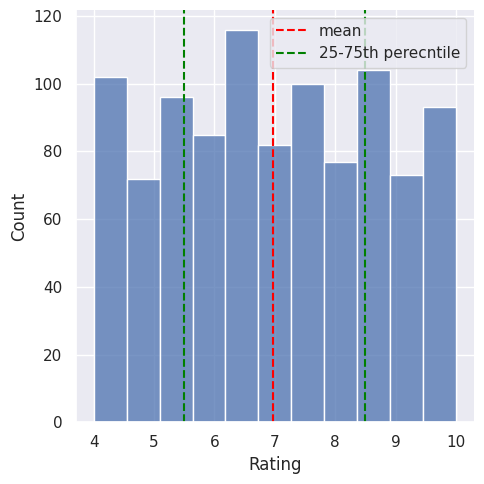

In [294]:
#Plotting the 'Rating' coulmn and checking what is the distribution of customer ratings looks like.
sns.displot(df['Rating'])
plt.axvline(x=np.mean(df['Rating']),c='red',ls='--',label='mean')
plt.axvline(x=np.percentile(df['Rating'],25),c='green',ls='--',label='25-75th perecntile')
plt.axvline(x=np.percentile(df['Rating'],75),c='green',ls='--')
plt.legend()

array([[<Axes: title={'center': 'Unit price'}>,
        <Axes: title={'center': 'Quantity'}>,
        <Axes: title={'center': 'Tax 5%'}>],
       [<Axes: title={'center': 'Total'}>,
        <Axes: title={'center': 'cogs'}>,
        <Axes: title={'center': 'gross margin percentage'}>],
       [<Axes: title={'center': 'gross income'}>,
        <Axes: title={'center': 'Rating'}>, <Axes: >]], dtype=object)

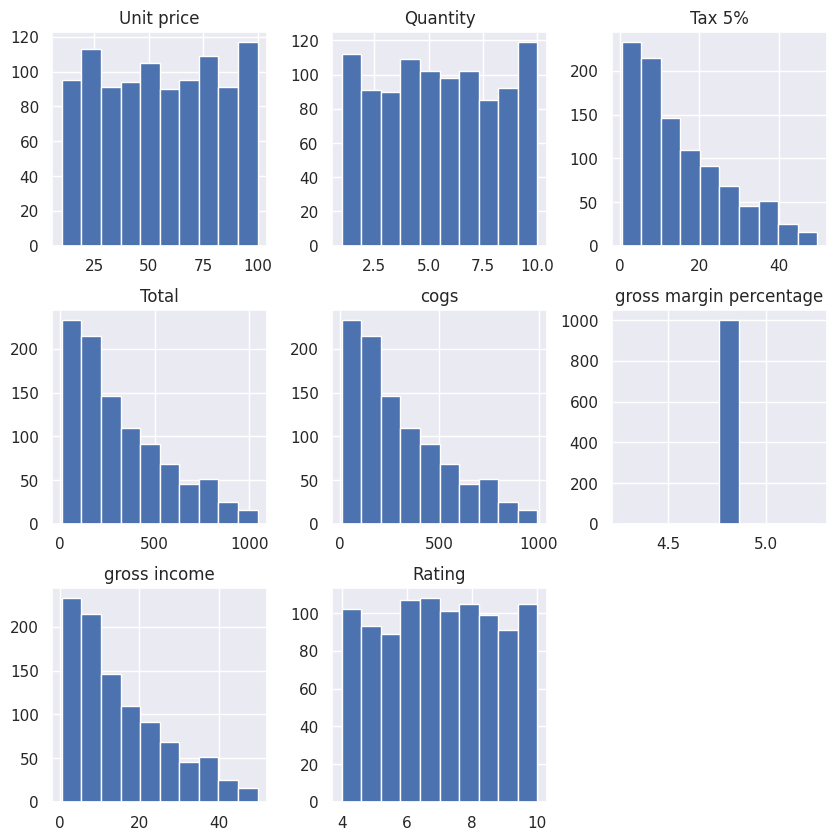

In [295]:
#Viewing the distribution of the dataframe columns.
df.hist(figsize=(10,10))

<Axes: xlabel='Branch', ylabel='count'>

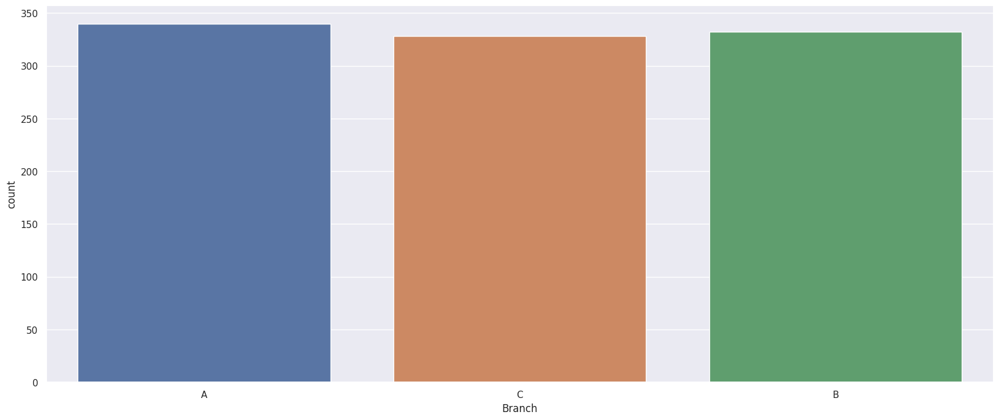

In [296]:
#Plotting 'Brance' column to check whether aggregate sales numbers differ by much between branches?
sns.countplot(x=df['Branch'])

In [297]:
#Viewing the value count of the 'Branch' column.
df['Branch'].value_counts()

A    340
B    332
C    328
Name: Branch, dtype: Int64

<Axes: xlabel='Payment', ylabel='count'>

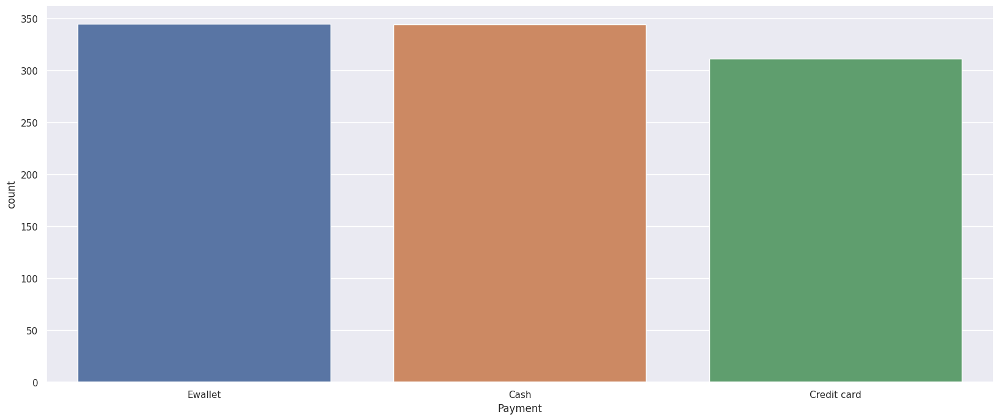

In [298]:
#Plotting 'Payment' column to check whether aggregate sales numbers differ by much between Payment types?
sns.countplot(x=df['Payment'])

In [299]:
#Viewing the value count of the 'Payment' column.
df['Payment'].value_counts()

Ewallet        345
Cash           344
Credit card    311
Name: Payment, dtype: Int64

<Axes: xlabel='Rating', ylabel='gross income'>

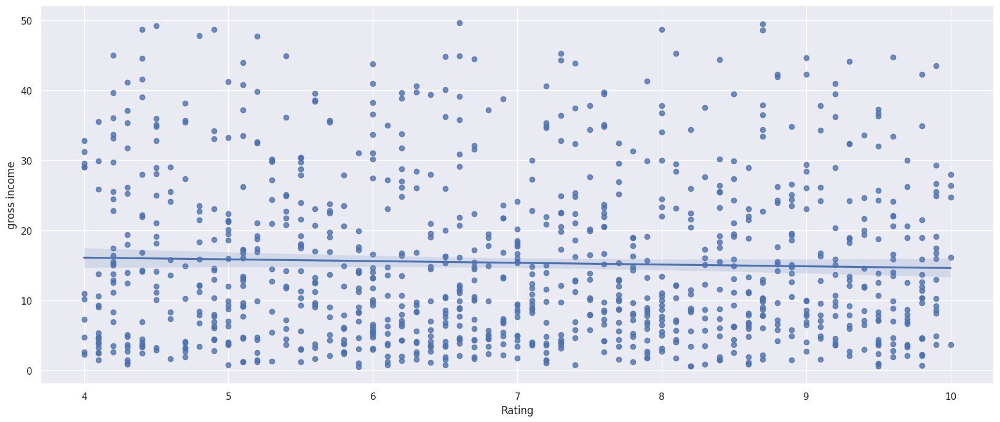

In [300]:
#Plotting 'Payment' column and 'gross income' to check if there a relationship between them.
sns.regplot(x=df['Rating'],y=df['gross income'])
#(Another way to plot it) sns.jointplot(data=df, x='Rating', y='gross income', kind="reg")

<Axes: xlabel='Branch', ylabel='gross income'>

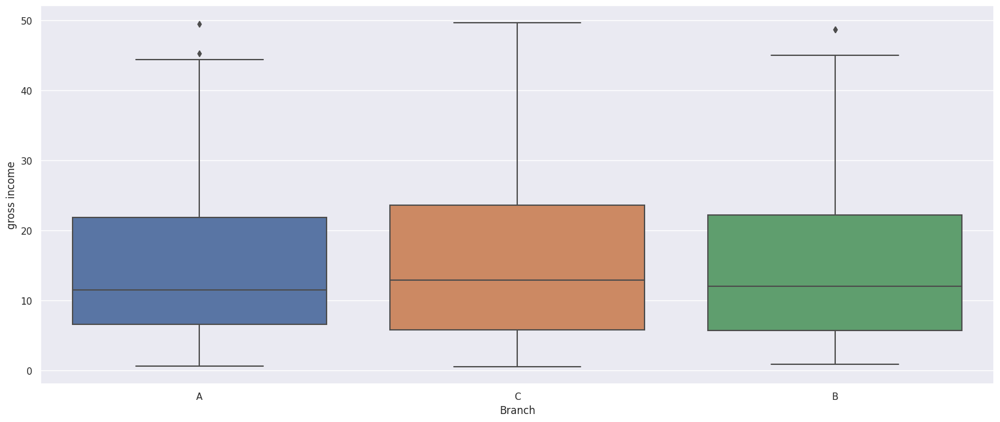

In [301]:
#Plotting 'Branch' column and 'gross income' to check if there a relationship between them.
sns.boxplot(x=df['Branch'],y=df['gross income'])

<Axes: xlabel='Gender', ylabel='gross income'>

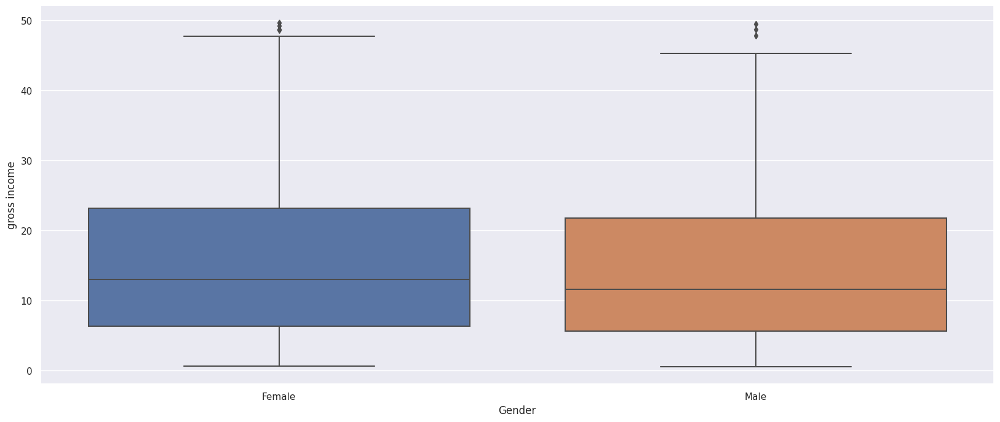

In [302]:
#Plotting 'Gender' column and 'gross income' to check if there a relationship between them.
sns.boxplot(x=df['Gender'],y=df['gross income'])

In [303]:
#Grouping the raws by the Date index.
df.groupby(df.index).mean()

<ipython-input-303-86d4e024e0eb>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby(df.index).mean()


,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,
2019-01-01,54.995833,6.750000,18.830083,395.431750,376.601667,4.761905,18.830083,6.583333
2019-01-02,44.635000,6.000000,11.580375,243.187875,231.607500,4.761905,11.580375,6.050000
2019-01-03,59.457500,4.625000,12.369813,259.766062,247.396250,4.761905,12.369813,8.112500
2019-01-04,51.743333,5.333333,12.886417,270.614750,257.728333,4.761905,12.886417,6.516667
2019-01-05,61.636667,4.583333,14.034458,294.723625,280.689167,4.761905,14.034458,7.433333
...,...,...,...,...,...,...,...,...
2019-03-26,42.972308,4.000000,7.188692,150.962538,143.773846,4.761905,7.188692,6.623077
2019-03-27,56.841000,4.500000,13.822950,290.281950,276.459000,4.761905,13.822950,6.760000
2019-03-28,45.525000,4.800000,10.616200,222.940200,212.324000,4.761905,10.616200,7.050000


In [304]:
#Getting the 'Date' index for the plot.
df.groupby(df.index).mean().index

<ipython-input-304-9cf12a833420>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby(df.index).mean().index


DatetimeIndex(['2019-01-01', '2019-01-02', '2019-01-03', '2019-01-04',
               '2019-01-05', '2019-01-06', '2019-01-07', '2019-01-08',
               '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-12',
               '2019-01-13', '2019-01-14', '2019-01-15', '2019-01-16',
               '2019-01-17', '2019-01-18', '2019-01-19', '2019-01-20',
               '2019-01-21', '2019-01-22', '2019-01-23', '2019-01-24',
               '2019-01-25', '2019-01-26', '2019-01-27', '2019-01-28',
               '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01',
               '2019-02-02', '2019-02-03', '2019-02-04', '2019-02-05',
               '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-09',
               '2019-02-10', '2019-02-11', '2019-02-12', '2019-02-13',
               '2019-02-14', '2019-02-15', '2019-02-16', '2019-02-17',
               '2019-02-18', '2019-02-19', '2019-02-20', '2019-02-21',
               '2019-02-22', '2019-02-23', '2019-02-24', '2019-02-25',
      

<ipython-input-305-b4274974e41a>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sns.lineplot(x=df.groupby(df.index).mean().index,
<ipython-input-305-b4274974e41a>:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  y=df.groupby(df.index).mean()['gross income'])


<Axes: xlabel='Date', ylabel='gross income'>

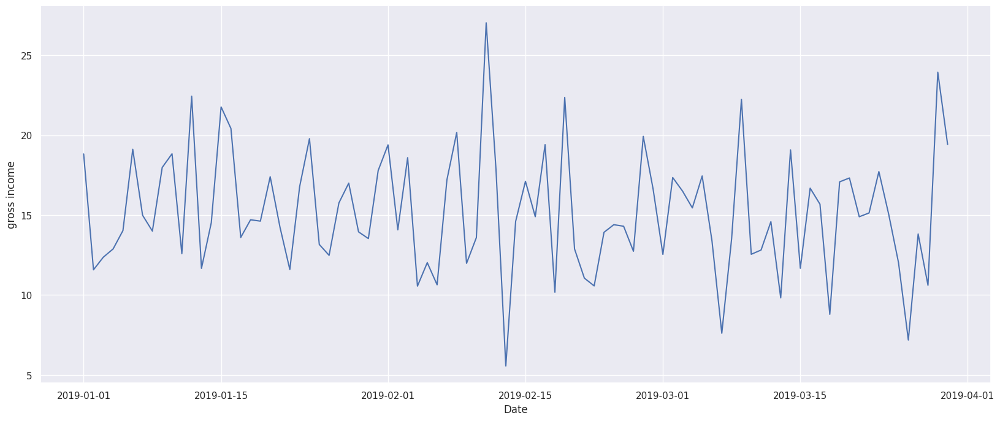

In [305]:
#Plotting if there any noticable time trend in gross income.
sns.lineplot(x=df.groupby(df.index).mean().index,
             y=df.groupby(df.index).mean()['gross income'])

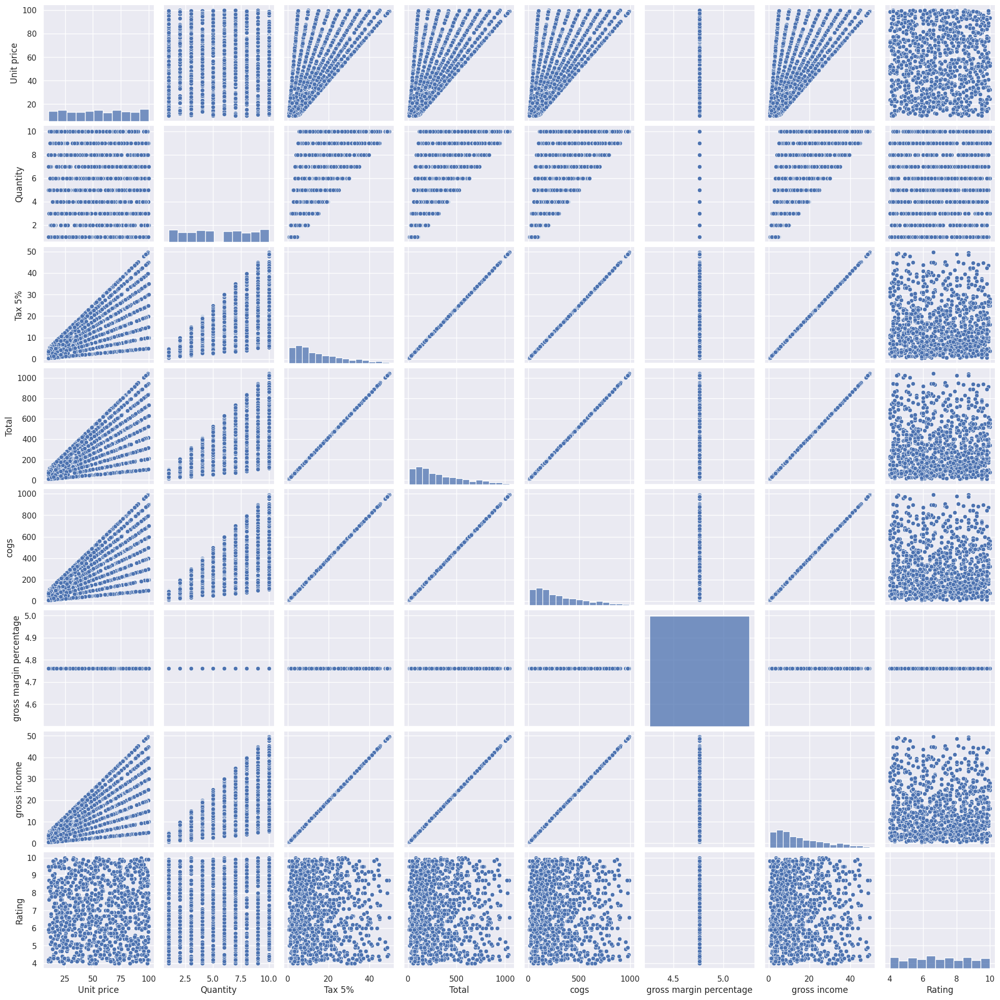

In [306]:
#Plotting every relationship between columns (Dont use it for large dataset).
sns.pairplot(df)

---

#### Handling Duplicates and Missing Values

In [307]:
#Counting the duplicates raws.
df.duplicated().sum()

0

In [308]:
#Viewing all the duplicates raws.
df[df.duplicated() ==True]

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,


In [309]:
#Dropping all the duplicates raws.
df.drop_duplicates(inplace=True)

In [310]:
#Checking if there any missing data.
df.isna().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

<Axes: ylabel='Date'>

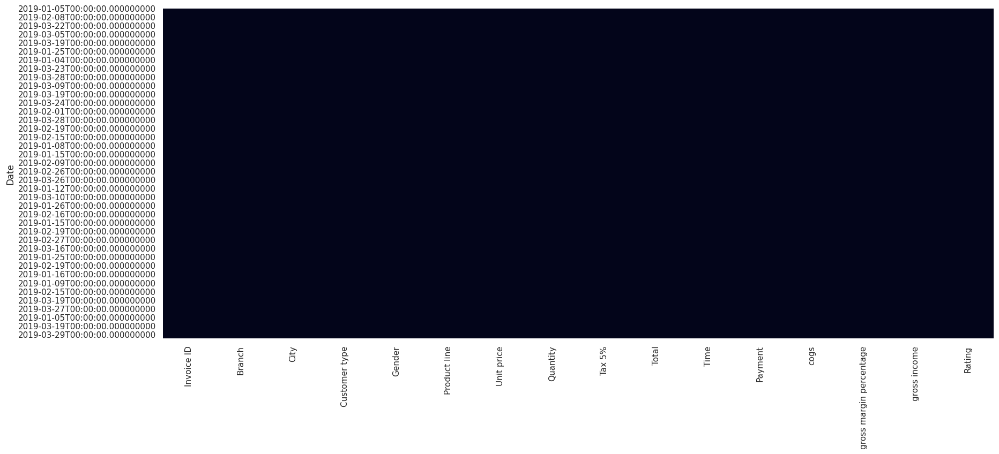

In [311]:
#Heatmap for the missing values.
sns.heatmap(df.isnull(),cbar=False)

In [312]:
#Filling any numirical missing value with the mean of the column.
df.fillna(df.mean(),inplace=True)

<ipython-input-312-306085458ba2>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.fillna(df.mean(),inplace=True)


In [313]:
#Filling any String or object value with most value appers in the column.
df.fillna(df.mode().iloc[0],inplace=True)

<ipython-input-313-f158caa695a6>:2: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  df.fillna(df.mode().iloc[0],inplace=True)


---

###Correlation Analysis

In [314]:
#Checking the corrlation coefficients.
round(np.corrcoef(df['gross income'],df['Rating'])[1][0],2)

-0.04

In [315]:
#Viewing all the columns corrlation.
np.round(df.corr(),2)

<ipython-input-315-16bcf049b733>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  np.round(df.corr(),2)


,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Unit price,1.00,0.01,0.63,0.63,0.63,NaN,0.63,-0.01
Quantity,0.01,1.00,0.71,0.71,0.71,NaN,0.71,-0.02
Tax 5%,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
Total,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
cogs,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
gross margin percentage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gross income,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
Rating,-0.01,-0.02,-0.04,-0.04,-0.04,NaN,-0.04,1.00


<ipython-input-316-12e3e3398ce5>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(np.round(df.corr(),2),annot=True)


<Axes: >

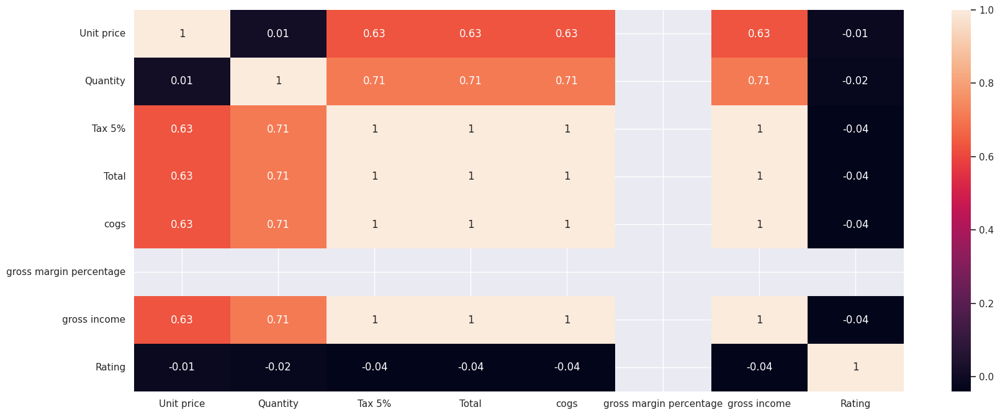

In [316]:
#Corrlation heatmap.
sns.heatmap(np.round(df.corr(),2),annot=True)

###Another way to check all the details of the dataset

In [317]:
#Another way to check all the details of the dataset (Try not using it with large datasets)
#Creating new Variable of the original dataset to see all the details
dataset_url2 = 'https://raw.githubusercontent.com/abdulilahalqasem/Supermarket-Sales/main/Dataset/supermarket_sales.csv'
dataset2 = pd.read_csv(dataset_url2)

In [318]:
profile_dataset = ProfileReport(dataset2)
profile_dataset

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## **#4 Model**

In [319]:
df.head(10)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,
2019-01-05,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,13:08,Ewallet,522.83,4.761905,26.1415,9.1
2019-03-08,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,10:29,Cash,76.40,4.761905,3.8200,9.6
2019-03-03,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,13:23,Credit card,324.31,4.761905,16.2155,7.4
2019-01-27,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,20:33,Ewallet,465.76,4.761905,23.2880,8.4
2019-02-08,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,10:37,Ewallet,604.17,4.761905,30.2085,5.3
2019-03-25,699-14-3026,C,Naypyitaw,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,18:30,Ewallet,597.73,4.761905,29.8865,4.1
2019-02-25,355-53-5943,A,Yangon,Member,Female,Electronic accessories,68.84,6,20.6520,433.6920,14:36,Ewallet,413.04,4.761905,20.6520,5.8
2019-02-24,315-22-5665,C,Naypyitaw,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,11:38,Ewallet,735.60,4.761905,36.7800,8.0
2019-01-10,665-32-9167,A,Yangon,Member,Female,Health and beauty,36.26,2,3.6260,76.1460,17:15,Credit card,72.52,4.761905,3.6260,7.2


In [320]:
LE=LabelEncoder()

categories=['Branch', 'City', 'Customer type', 'Gender', 'Product line', 'Payment']
for label in categories:
    df[label]=LE.fit_transform(df[label])

In [321]:
df.head(10)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,,,,,,,,,
2019-01-05,750-67-8428,0,2,0,0,3,74.69,7,26.1415,548.9715,13:08,2,522.83,4.761905,26.1415,9.1
2019-03-08,226-31-3081,2,1,1,0,0,15.28,5,3.8200,80.2200,10:29,0,76.40,4.761905,3.8200,9.6
2019-03-03,631-41-3108,0,2,1,1,4,46.33,7,16.2155,340.5255,13:23,1,324.31,4.761905,16.2155,7.4
2019-01-27,123-19-1176,0,2,0,1,3,58.22,8,23.2880,489.0480,20:33,2,465.76,4.761905,23.2880,8.4
2019-02-08,373-73-7910,0,2,1,1,5,86.31,7,30.2085,634.3785,10:37,2,604.17,4.761905,30.2085,5.3
2019-03-25,699-14-3026,2,1,1,1,0,85.39,7,29.8865,627.6165,18:30,2,597.73,4.761905,29.8865,4.1
2019-02-25,355-53-5943,0,2,0,0,0,68.84,6,20.6520,433.6920,14:36,2,413.04,4.761905,20.6520,5.8
2019-02-24,315-22-5665,2,1,1,0,4,73.56,10,36.7800,772.3800,11:38,2,735.60,4.761905,36.7800,8.0
2019-01-10,665-32-9167,0,2,0,0,3,36.26,2,3.6260,76.1460,17:15,1,72.52,4.761905,3.6260,7.2


In [322]:
#Spliting the data for the target variable.
x = df.drop(['Total','Invoice ID','Time'],axis=1)
y= df['Total']

print('The dimensions of x is : ',x.shape)
print('The dimensions of y is : ',y.shape)

The dimensions of x is :  (1000, 13)
The dimensions of y is :  (1000,)


In [323]:
# List of all 6 classifiers.
model_list = [LinearRegression(), svm.SVR(), KNeighborsRegressor(n_neighbors=7),
              DecisionTreeRegressor(), RandomForestRegressor(),
              xgb.XGBRegressor(objective='reg:squarederror')]

model_names_list = ['LR', 'SVM', 'KNN','DT', 'RF', 'XGB']

In [324]:
# Models evaluation using 5-fold cross-validation.
cross_validator = ShuffleSplit(n_splits=5)

mae_scores = []
mse_scores = []
r2_scores = []

for i in range(len(model_names_list)):  # Change to 6 to match the number of models
    model = model_list[i]

    mae = -cross_val_score(model, x, y, scoring='neg_mean_absolute_error', cv=cross_validator)
    mse = -cross_val_score(model, x, y, scoring='neg_mean_squared_error', cv=cross_validator)
    r2 = cross_val_score(model, x, y, scoring='r2', cv=cross_validator)

    mae_scores.append(np.mean(mae))
    mse_scores.append(np.mean(mse))
    r2_scores.append(np.mean(r2))

    print('Metrics for {} model:'.format(model_names_list[i]))
    print('Mean Absolute Error: {:.2f}'.format(np.mean(mae)))
    print('Mean Squared Error: {:.2f}'.format(np.mean(mse)))
    print('R-squared (R2): {:.2f}'.format(np.mean(r2)))
    print()

Metrics for LR model:
Mean Absolute Error: 0.00
Mean Squared Error: 0.00
R-squared (R2): 1.00

Metrics for SVM model:
Mean Absolute Error: 58.66
Mean Squared Error: 14867.34
R-squared (R2): 0.76

Metrics for KNN model:
Mean Absolute Error: 1.96
Mean Squared Error: 8.71
R-squared (R2): 1.00

Metrics for DT model:
Mean Absolute Error: 1.07
Mean Squared Error: 2.83
R-squared (R2): 1.00

Metrics for RF model:
Mean Absolute Error: 0.79
Mean Squared Error: 1.59
R-squared (R2): 1.00

Metrics for XGB model:
Mean Absolute Error: 2.31
Mean Squared Error: 12.55
R-squared (R2): 1.00



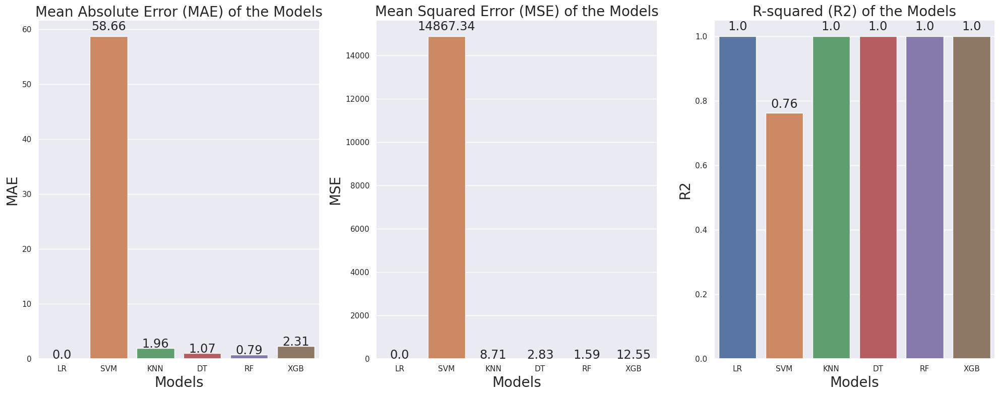

In [325]:
# Results visualization. [MAE, MSE, R2]
sns.set(rc={'figure.figsize':(20, 8)})

# MAE Visualization
plt.subplot(131)
ax1 = sns.barplot(x=model_names_list, y=mae_scores)
plt.xlabel('Models', fontsize=20)
plt.ylabel('MAE', fontsize=20)
plt.title('Mean Absolute Error (MAE) of the Models', fontsize=20)

for i in ax1.patches:
    width, height = i.get_width(), i.get_height()
    xs, ys = i.get_xy()
    ax1.annotate(f'{round(height,2)}', (xs + width/2, ys + height*1.02), ha='center', fontsize='x-large')

# MSE Visualization
plt.subplot(132)
ax2 = sns.barplot(x=model_names_list, y=mse_scores)
plt.xlabel('Models', fontsize=20)
plt.ylabel('MSE', fontsize=20)
plt.title('Mean Squared Error (MSE) of the Models', fontsize=20)

for i in ax2.patches:
    width, height = i.get_width(), i.get_height()
    xs, ys = i.get_xy()
    ax2.annotate(f'{round(height,2)}', (xs + width/2, ys + height*1.02), ha='center', fontsize='x-large')

# R2 Visualization
plt.subplot(133)
ax3 = sns.barplot(x=model_names_list, y=r2_scores)
plt.xlabel('Models', fontsize=20)
plt.ylabel('R2', fontsize=20)
plt.title('R-squared (R2) of the Models', fontsize=20)

for i in ax3.patches:
    width, height = i.get_width(), i.get_height()
    xs, ys = i.get_xy()
    ax3.annotate(f'{round(height,2)}', (xs + width/2, ys + height*1.02), ha='center', fontsize='x-large')

plt.tight_layout()
plt.show()

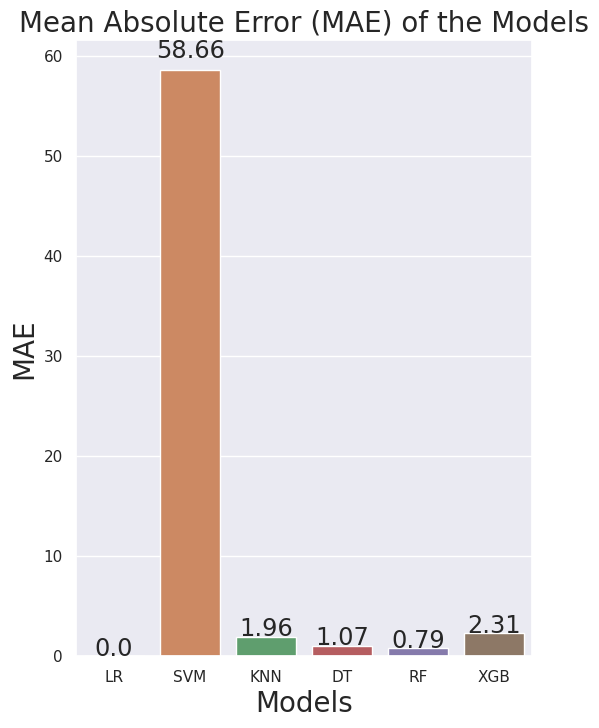

In [326]:
# MAE Visualization
plt.subplot(131)
ax1 = sns.barplot(x=model_names_list, y=mae_scores)
plt.xlabel('Models', fontsize=20)
plt.ylabel('MAE', fontsize=20)
plt.title('Mean Absolute Error (MAE) of the Models', fontsize=20)

for i in ax1.patches:
    width, height = i.get_width(), i.get_height()
    xs, ys = i.get_xy()
    ax1.annotate(f'{round(height,2)}', (xs + width/2, ys + height*1.02), ha='center', fontsize='x-large')

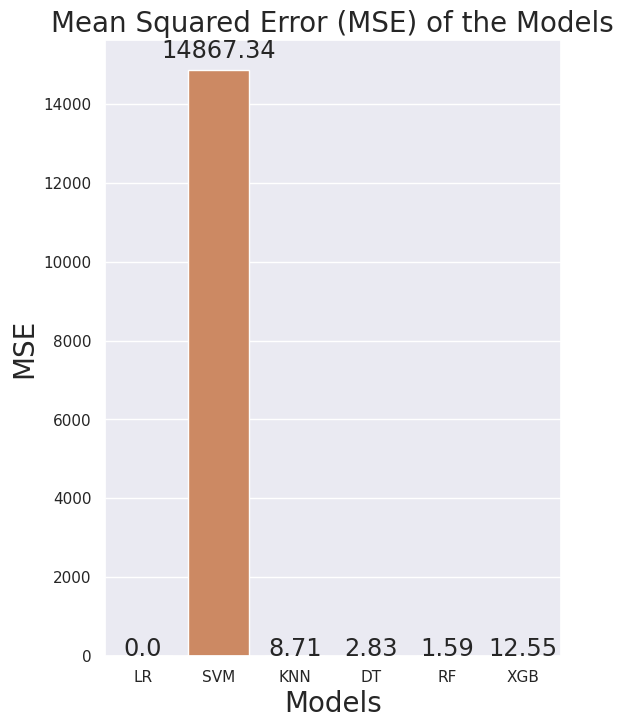

In [327]:
# MSE Visualization
plt.subplot(132)
ax2 = sns.barplot(x=model_names_list, y=mse_scores)
plt.xlabel('Models', fontsize=20)
plt.ylabel('MSE', fontsize=20)
plt.title('Mean Squared Error (MSE) of the Models', fontsize=20)

for i in ax2.patches:
    width, height = i.get_width(), i.get_height()
    xs, ys = i.get_xy()
    ax2.annotate(f'{round(height,2)}', (xs + width/2, ys + height*1.02), ha='center', fontsize='x-large')

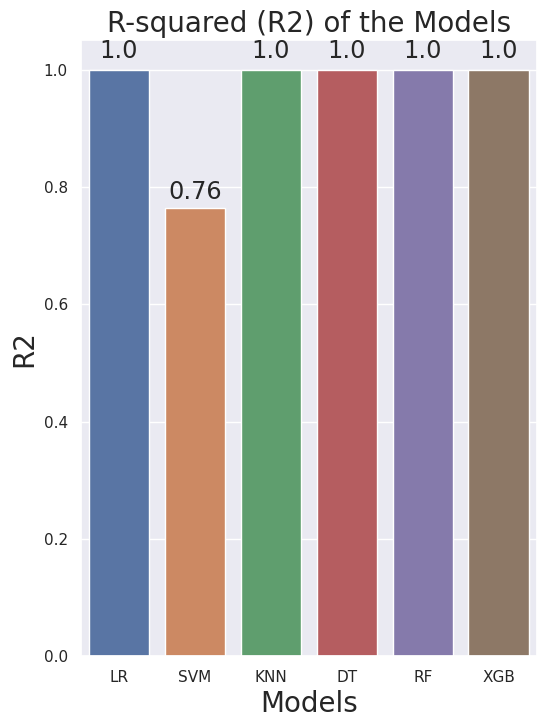

In [328]:
# R2 Visualization
plt.subplot(133)
ax3 = sns.barplot(x=model_names_list, y=r2_scores)
plt.xlabel('Models', fontsize=20)
plt.ylabel('R2', fontsize=20)
plt.title('R-squared (R2) of the Models', fontsize=20)

for i in ax3.patches:
    width, height = i.get_width(), i.get_height()
    xs, ys = i.get_xy()
    ax3.annotate(f'{round(height,2)}', (xs + width/2, ys + height*1.02), ha='center', fontsize='x-large')
